# Train GANs on Fashion-MNIST

**In the first phase**, train the discriminator. A batch of real
images is sampled from the training set with an equal number of fake images produced by the generator. The labels are set to 0 for fake images and 1 for real images, and the discriminator is trained on this labeled batch for one step. Backpropagation only
optimizes the weights of the discriminator during this phase.

**In the second phase**, train the generator. It produces another batch of fake images, and the discriminator tells whether the images are fake or real. This time no real images is added to the batch, and all the
labels are set to 1 (real), so the generator produces images that the discriminator will (wrongly) believe to be real. The weights of the discriminator are frozen during this step, so backpropagation only affects the weights of the generator.

The generator never actually sees any real images, yet it gradually learns to produce convincing fake images. All it gets is the gradients flowing back through the discriminator. The better the discriminator gets, the more information about the real images is contained in these secondhand gradients, so the generator can make significant progress.


In [ ]:
import tensorflow as tf
import os, keras
import numpy as np
import matplotlib.pyplot as plt

##Split dataset

In [ ]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

4422102/4422102 [==============================] - 0s 0us/step


# Create GAN model

In [ ]:
tf.random.set_seed(42)

codings_size = 30

#the generator and discriminator
generator = keras.models.Sequential([ 
    keras.layers.Dense(100, activation="selu", input_shape=[codings_size]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
discriminator = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(1, activation="sigmoid")
])
#the full GAN model containing generator and discriminator
gan = keras.models.Sequential([generator, discriminator])

##Compile the model

In [ ]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop") # The generator will only be trained through the gan model (fase 2)
discriminator.trainable = False # the discriminator will not be trained during phase 2 (when methods are called on the gan model)  
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

##Create training function

In [ ]:
# Create a Dataset to iterate through the images since regular fit() method cannot be used
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [ ]:
# wrap dataset loop in a train_gan() function
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))             
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size]) #feed Gaussian noise to the generator to produce fake images
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0) #concatenate equal number of real images
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size) #set target y1 to 0 for fake images and 1 for real images
            discriminator.trainable = True # True only to get rid of Keras warning, given False below
            discriminator.train_on_batch(X_fake_and_real, y1) # train the discriminator on the batch 

            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size]) # feed the GAN Gaussian noise to produce fake images
            y2 = tf.constant([[1.]] * batch_size)# set target y2 to 1, so discriminator believes that fake images are real
            discriminator.trainable = False # False only to get rid of Keras warning, given True above
            gan.train_on_batch(noise, y2)
        plot_multiple_images(generated_images, 8)                     
        plt.show()                                                    

##Train the model

Saving figure gan_generated_images_plot


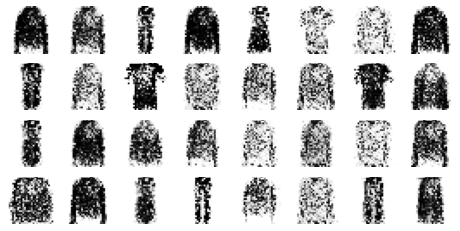

In [ ]:
#Test the function
tf.random.set_seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)
save_fig("gan_generated_images_plot", tight_layout=False)

Epoch 1/1


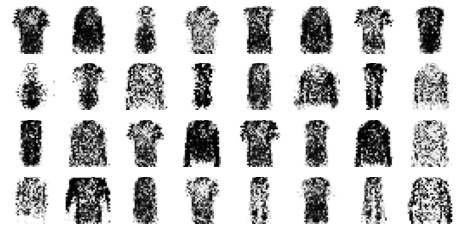

In [ ]:
# test the function
train_gan(gan, dataset, batch_size, codings_size, n_epochs=1)

Epoch 1/50


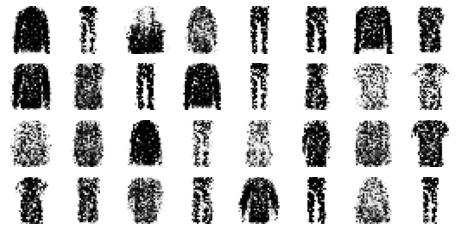

Epoch 2/50


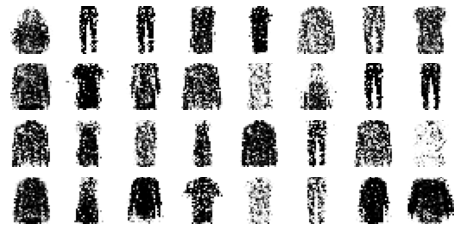

Epoch 3/50


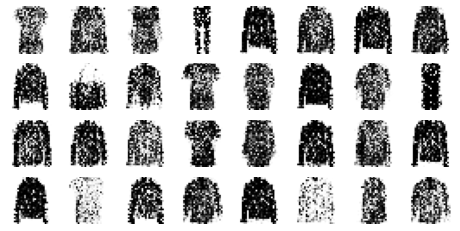

Epoch 4/50


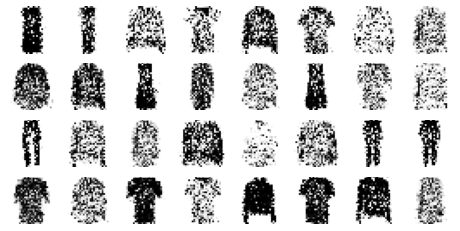

Epoch 5/50


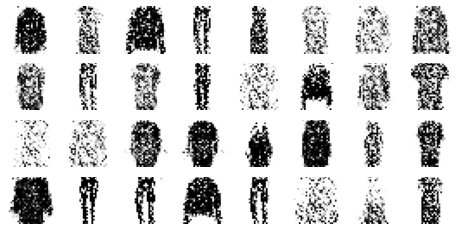

Epoch 6/50


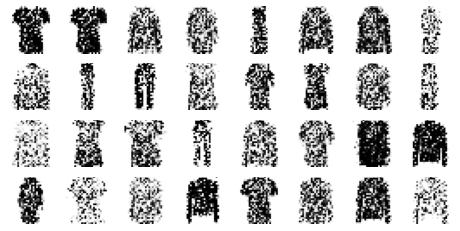

Epoch 7/50


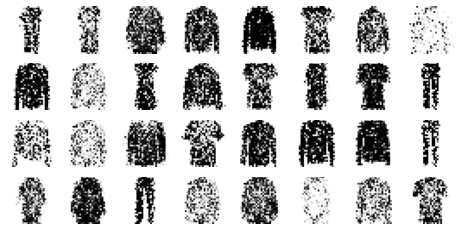

Epoch 8/50


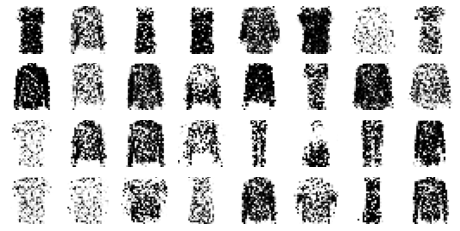

Epoch 9/50


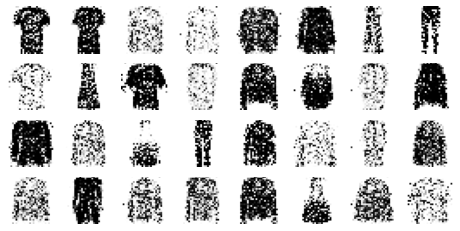

Epoch 10/50


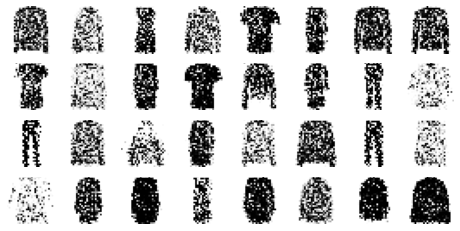

Epoch 11/50


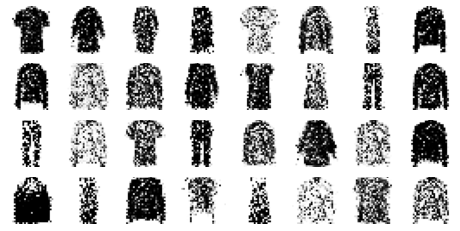

Epoch 12/50


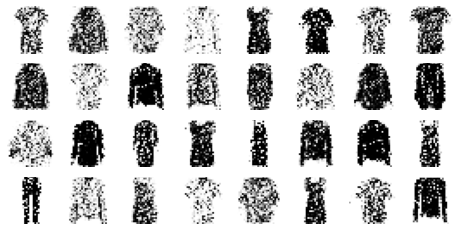

Epoch 13/50


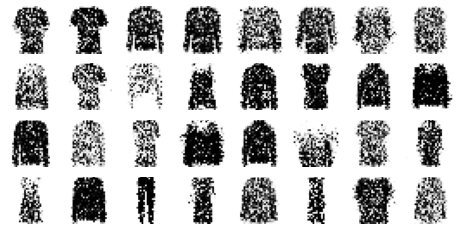

Epoch 14/50


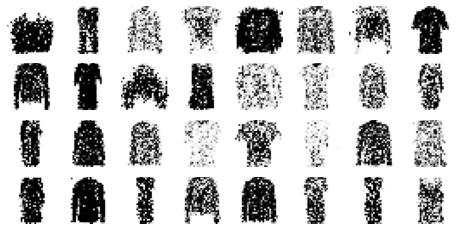

Epoch 15/50


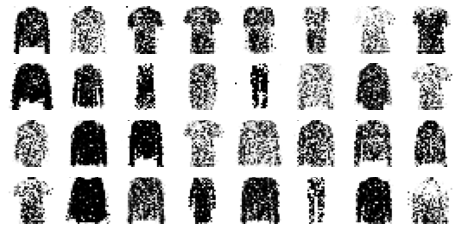

Epoch 16/50


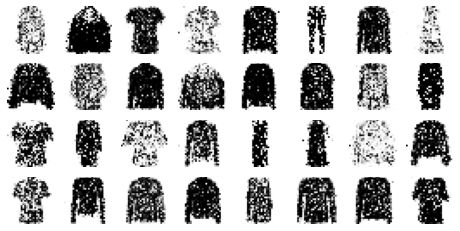

Epoch 17/50


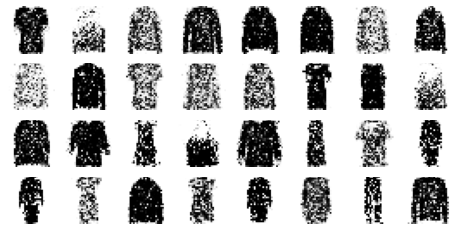

Epoch 18/50


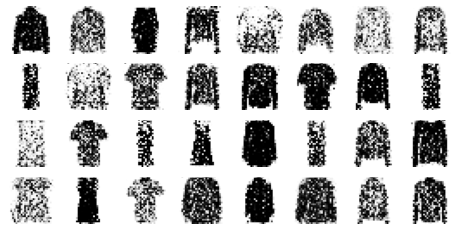

Epoch 19/50


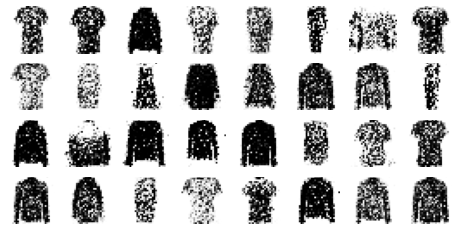

Epoch 20/50


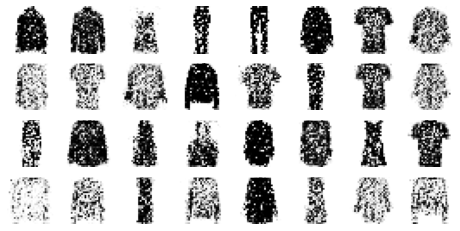

Epoch 21/50


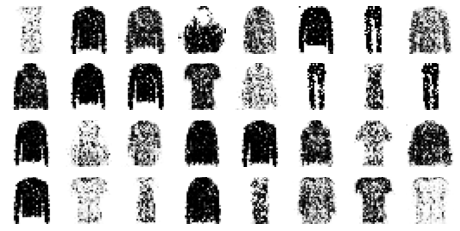

Epoch 22/50


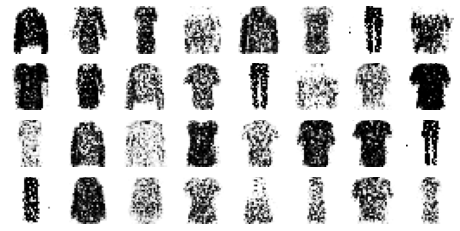

Epoch 23/50


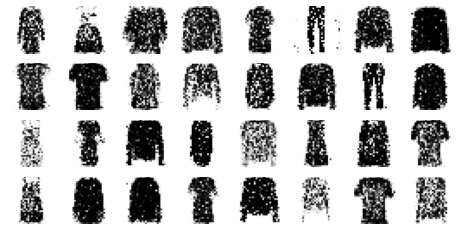

Epoch 24/50


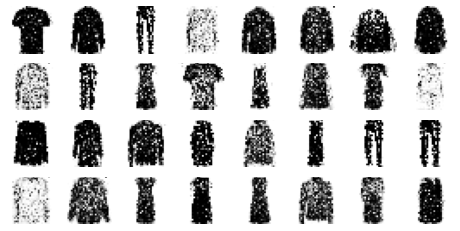

Epoch 25/50


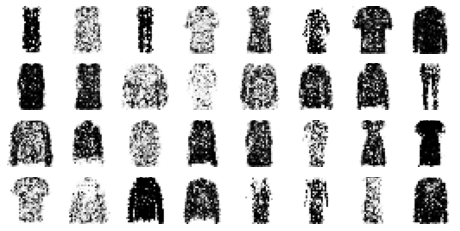

Epoch 26/50


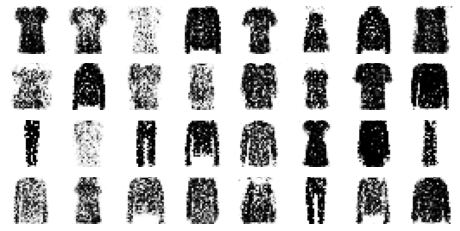

Epoch 27/50


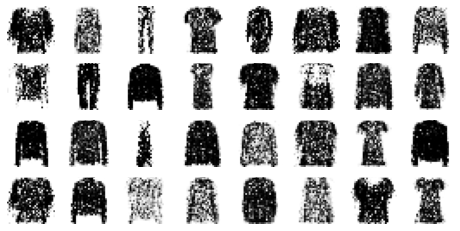

Epoch 28/50


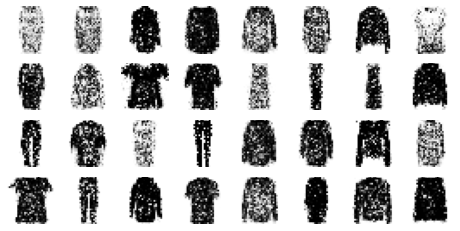

Epoch 29/50


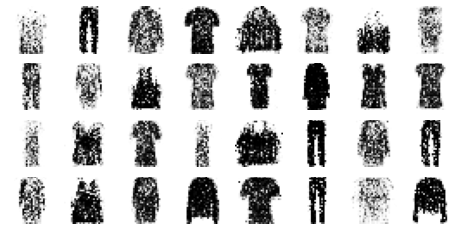

Epoch 30/50


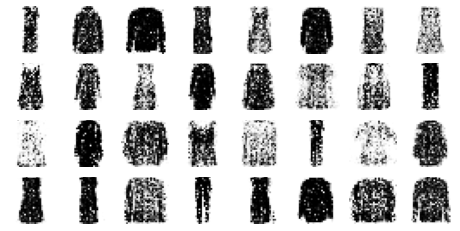

Epoch 31/50


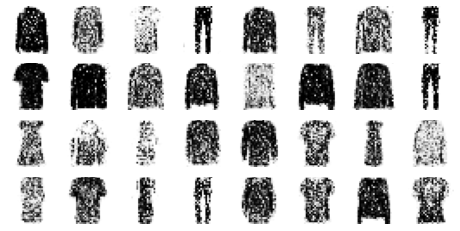

Epoch 32/50


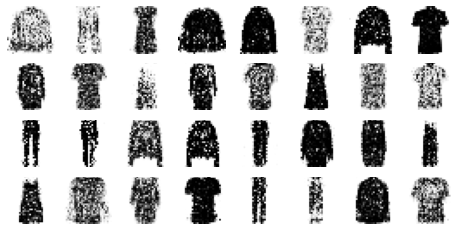

Epoch 33/50


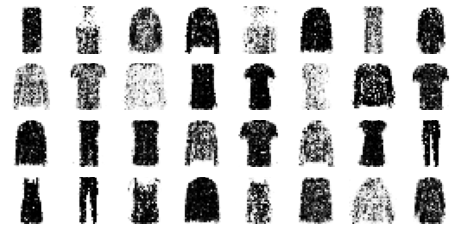

Epoch 34/50


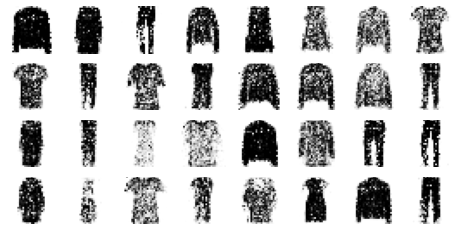

Epoch 35/50


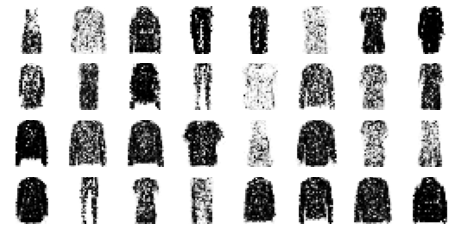

Epoch 36/50


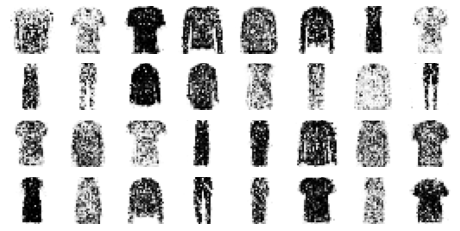

Epoch 37/50


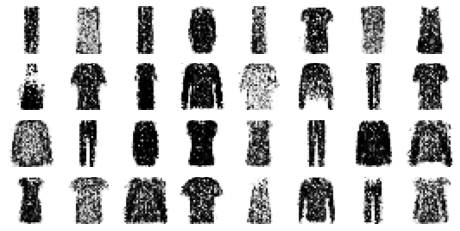

Epoch 38/50


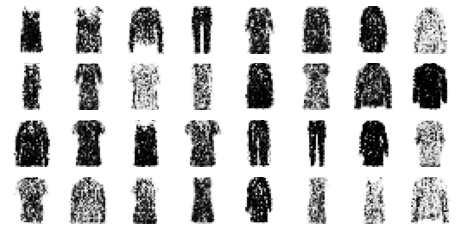

Epoch 39/50


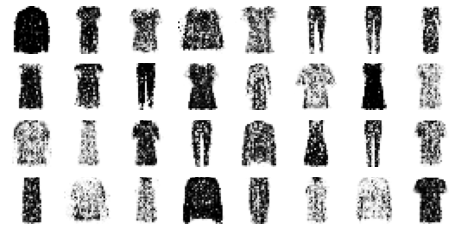

Epoch 40/50


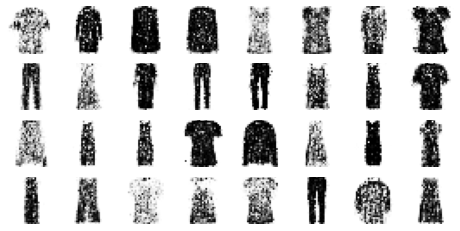

Epoch 41/50


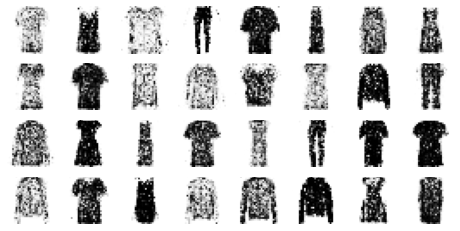

Epoch 42/50


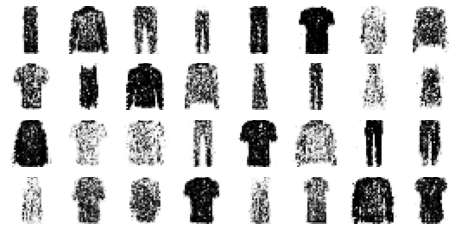

Epoch 43/50


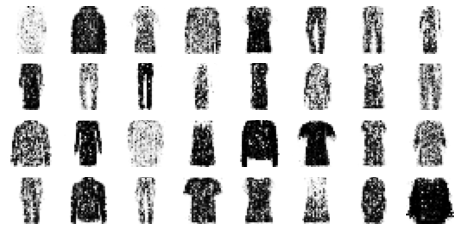

Epoch 44/50


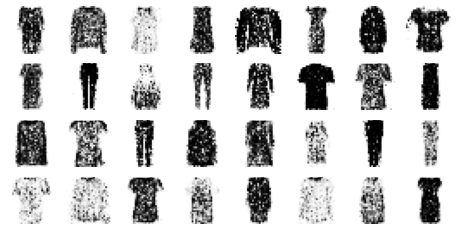

Epoch 45/50


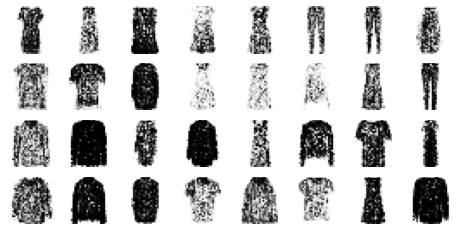

Epoch 46/50


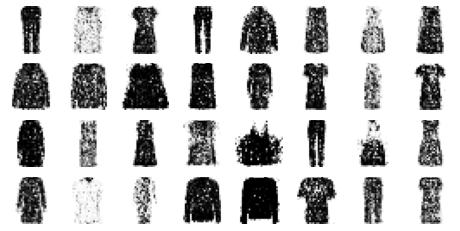

Epoch 47/50


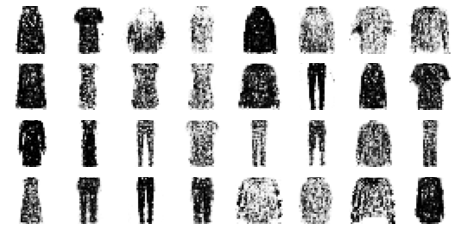

Epoch 48/50


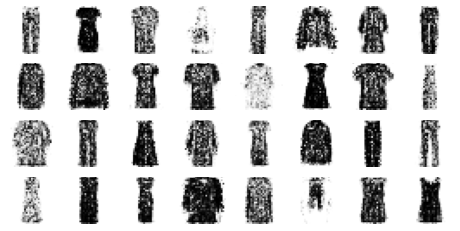

Epoch 49/50


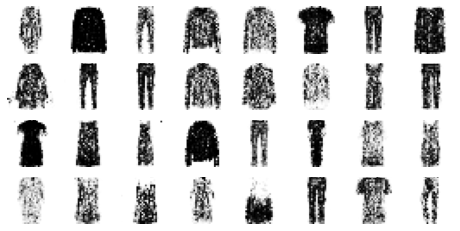

Epoch 50/50


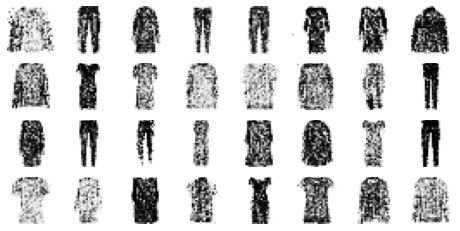

In [ ]:
# Train for 50 epochs
train_gan(gan, dataset, batch_size, codings_size)

# Create Deep Convolutional GAN

In [ ]:
tf.random.set_seed(42)

codings_size = 100

generator = keras.models.Sequential([
    keras.layers.Dense(7 * 7 * 128, input_shape=[codings_size]),#generator takes codings of size 100, and projects them to 6272 dimensions
    keras.layers.Reshape([7, 7, 128]), #Reshapes result to get a 7 × 7 × 128 tensor
    keras.layers.BatchNormalization(), # The tensor is batch normalized, 
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME", # ... and fed to a transposed conv layer of stride 2,
                                 activation="selu"), # ... and upsamples tensor from 7 × 7 to 14 × 14 and reduces its depth from 128 to 64
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME",
                                 activation="tanh"),# uses tanh activation, so outputs will range from –1 to 1
])

discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME", # use strided convolutions (strides=2) to downsample the image
                        activation=keras.layers.LeakyReLU(0.2), # leaky ReLU instead of SeLU in generator
                        input_shape=[28, 28, 1]),
    keras.layers.Dropout(0.4),# Dropout layers instead of BatchNormalization to stabilize training
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME", activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

In [ ]:
# compile the discrimator and the gan
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [ ]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1. # reshape and rescale given tanh activation, and to add the channel dimension 

In [ ]:
# build the dataset
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

Epoch 1/50


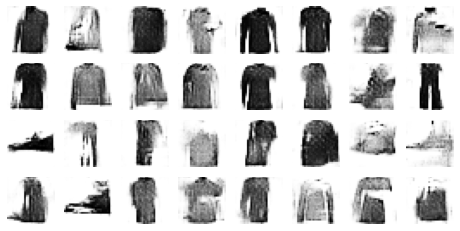

Epoch 2/50


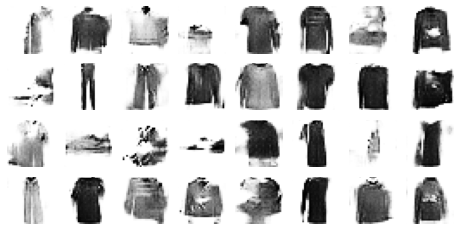

Epoch 3/50


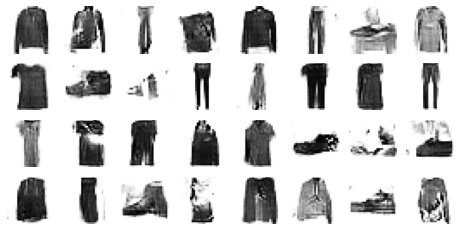

Epoch 4/50


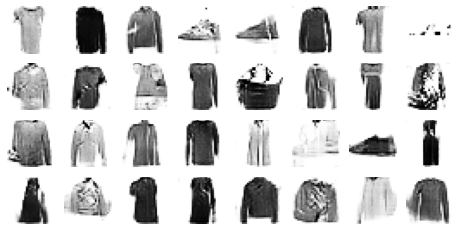

Epoch 5/50


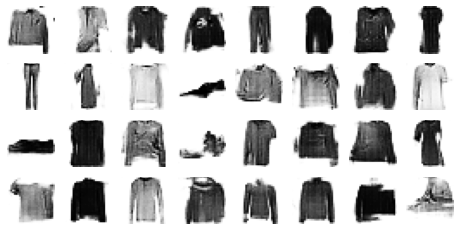

Epoch 6/50


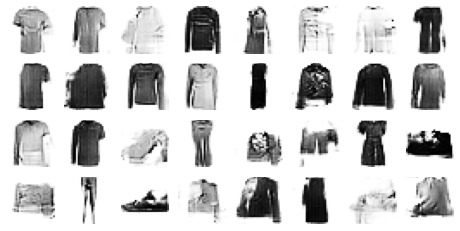

Epoch 7/50


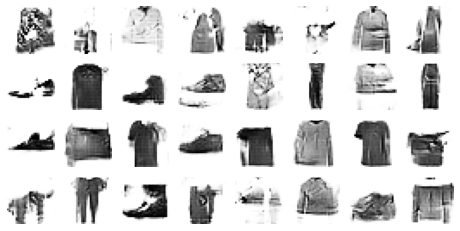

Epoch 8/50


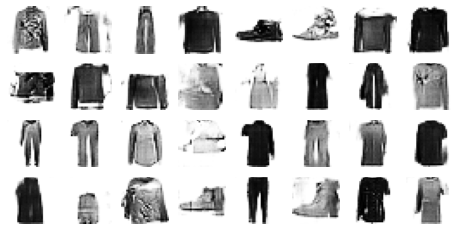

Epoch 9/50


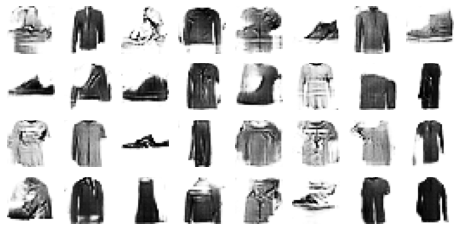

Epoch 10/50


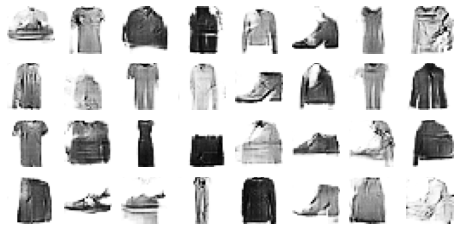

Epoch 11/50


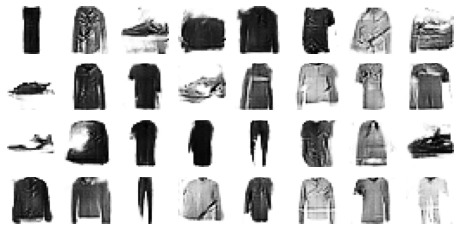

Epoch 12/50


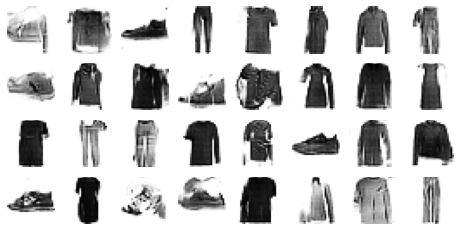

Epoch 13/50


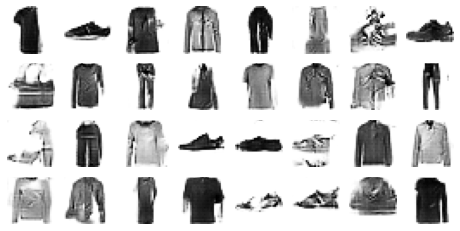

Epoch 14/50


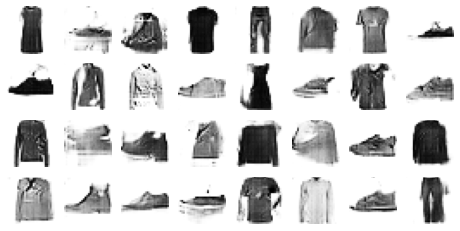

Epoch 15/50


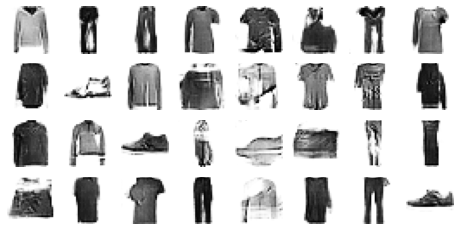

Epoch 16/50


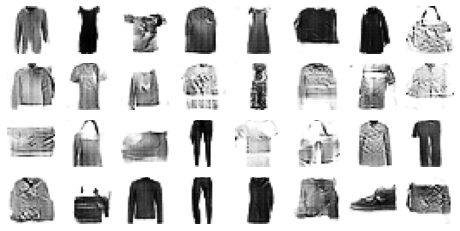

Epoch 17/50


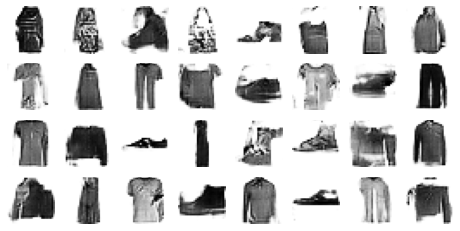

Epoch 18/50


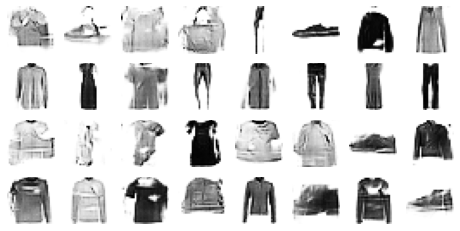

Epoch 19/50


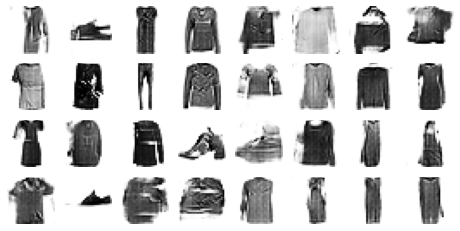

Epoch 20/50


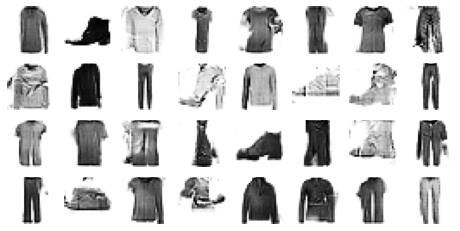

Epoch 21/50


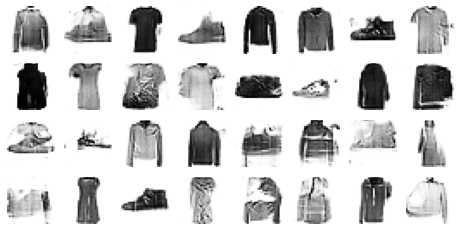

Epoch 22/50


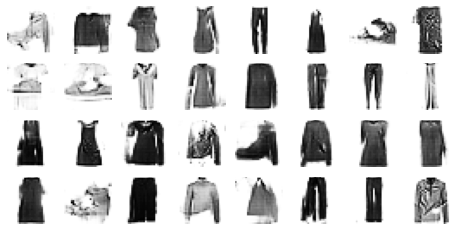

Epoch 23/50


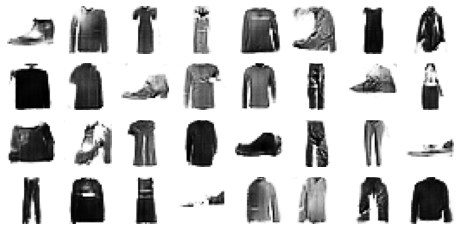

Epoch 24/50


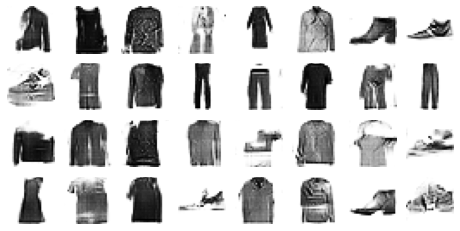

Epoch 25/50


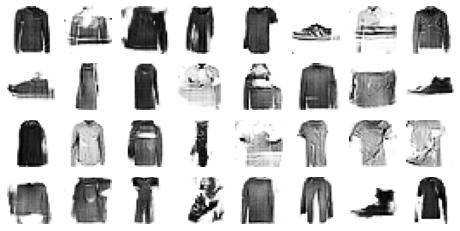

Epoch 26/50


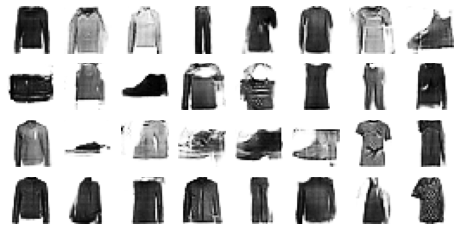

Epoch 27/50


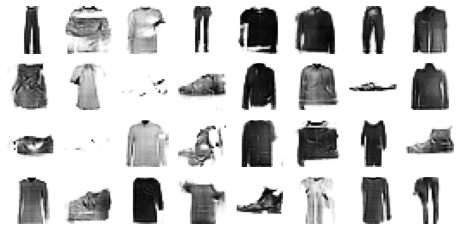

Epoch 28/50


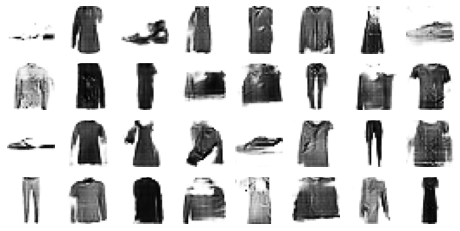

Epoch 29/50


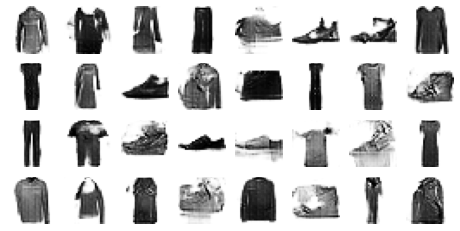

Epoch 30/50


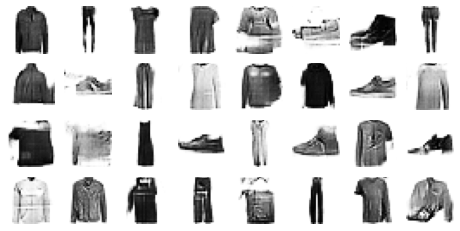

Epoch 31/50


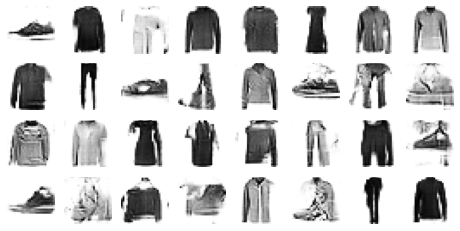

Epoch 32/50


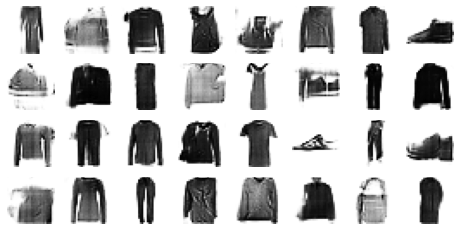

Epoch 33/50


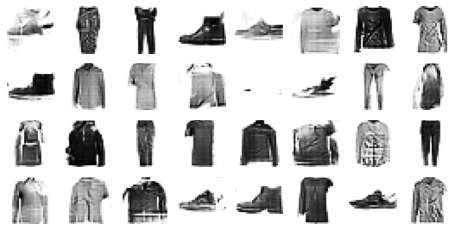

Epoch 34/50


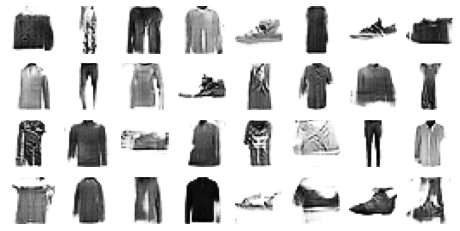

Epoch 35/50


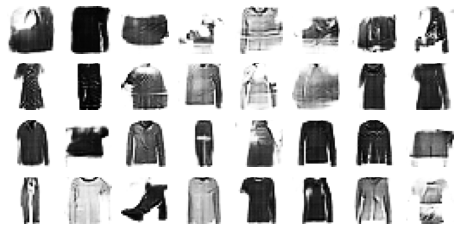

Epoch 36/50


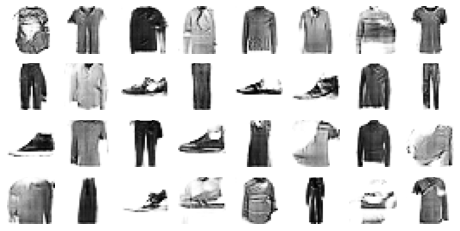

Epoch 37/50


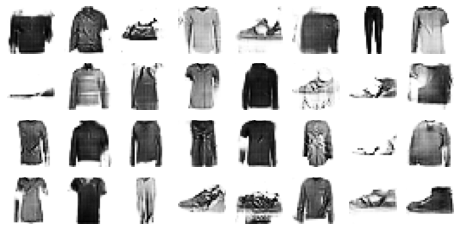

Epoch 38/50


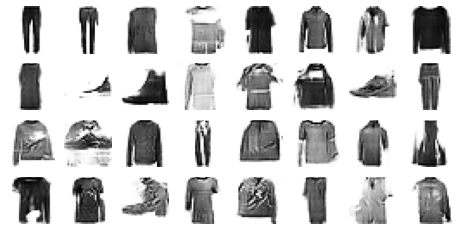

Epoch 39/50


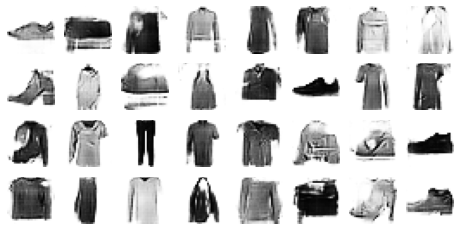

Epoch 40/50


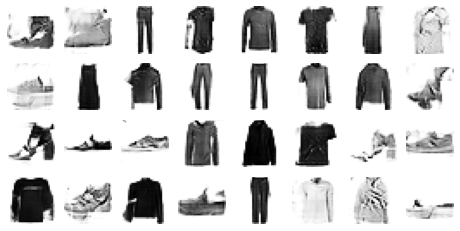

Epoch 41/50


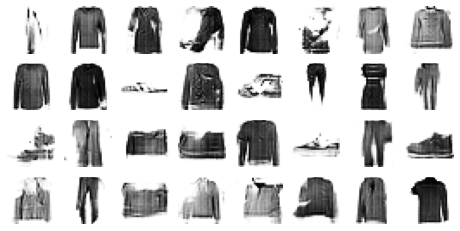

Epoch 42/50


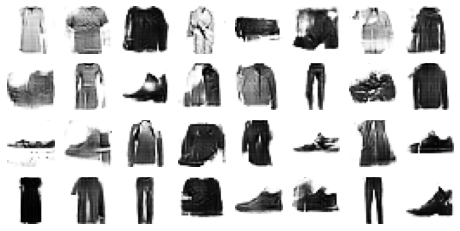

Epoch 43/50


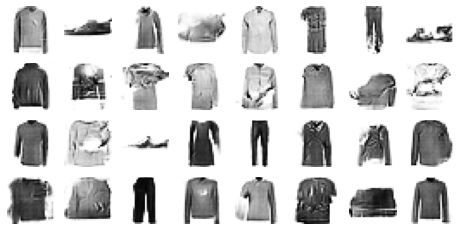

Epoch 44/50


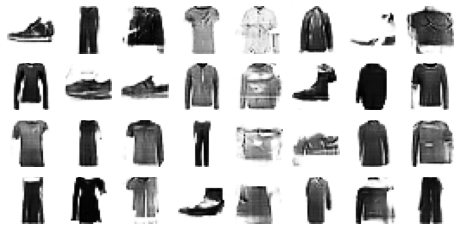

Epoch 45/50


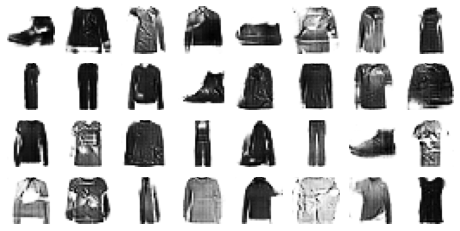

Epoch 46/50


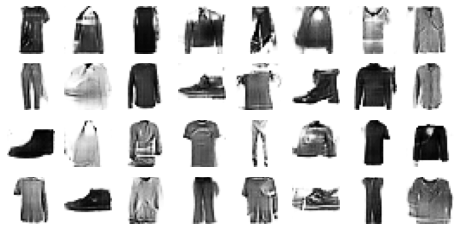

Epoch 47/50


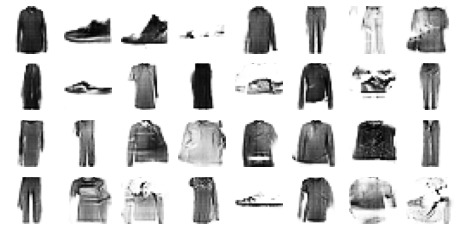

Epoch 48/50


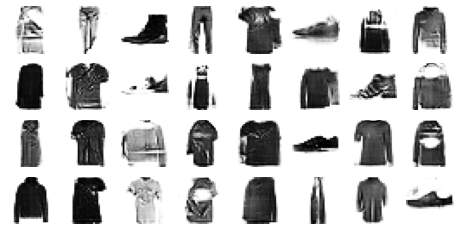

Epoch 49/50


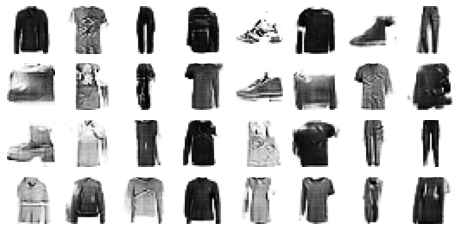

Epoch 50/50


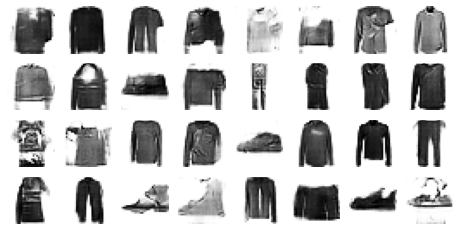

In [ ]:
train_gan(gan, dataset, batch_size, codings_size)

Saving figure dcgan_generated_images_plot


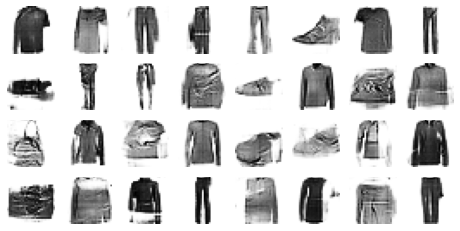

In [ ]:
tf.random.set_seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)
save_fig("dcgan_generated_images_plot", tight_layout=False)

# References

From the book "Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow" by Aurélien Géron.